In [0]:
from google.colab import drive
drive.mount('/content/drive')


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import numpy as np # linear algebra
import pandas as pd
import os
from tensorflow.python.keras.applications import ResNet50
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense, Flatten, GlobalAveragePooling2D, BatchNormalization
from tensorflow.python.keras.applications.resnet50 import preprocess_input
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.preprocessing.image import load_img, img_to_array
from keras.models import load_model
from tensorflow.python.keras import optimizers

In [0]:

resnet_weights_path = 'drive/My Drive/facex/resnet-50/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'

image_size = 32
batch_size = 12

data_generator = ImageDataGenerator(horizontal_flip=True,
                                   width_shift_range = 0.4,
                                   height_shift_range = 0.4,
                                   zoom_range=0.3,
                                   rotation_range=20,
                                   )
train_generator = data_generator.flow_from_directory(
    directory=r"drive/My Drive/resnet-50/data/train/",
    target_size=(32,32),
    color_mode="rgb",
    batch_size=32,
    class_mode="categorical",
    shuffle=True,
    seed=42
)

valid_generator = data_generator.flow_from_directory(
    directory=r"drive/My Drive/resnet-50/data/valid/",
    target_size=(224, 224),
    color_mode="rgb",
    batch_size=32,
    class_mode="categorical",
    shuffle=True,
    seed=42
)
test_generator = data_generator.flow_from_directory(
    directory=r"drive/My Drive/resnet-50/data/valid",
    target_size=(224, 224),
    color_mode="rgb",
    batch_size=1,
    class_mode=None,
    shuffle=False,
    seed=42
)
#save model
#model_json = model.to_json()

#Step Size
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=valid_generator.n//valid_generator.batch_size
#Number of classes
num_classes = len(train_generator.class_indices)
#Model
model = Sequential()
model.add(ResNet50(include_top=False, pooling='avg', weights=resnet_weights_path))

model.add(Flatten())
model.add(BatchNormalization())

model.add(Dense(2048, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(1024, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())

model.add(Dense(num_classes, activation='softmax'))

model.layers[0].trainable = False

adam = optimizers.Adam(lr = 0.01,decay = 0.01)

model.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

count = sum([len(files) for r, d, files in os.walk("drive/My Drive/resnet-50/")])


model.fit_generator(generator=train_generator,
                   steps_per_epoch=STEP_SIZE_TRAIN,
                   validation_data=valid_generator,
                   validation_steps=STEP_SIZE_VALID,
                   epochs=1
                   )

#with open("drive/My Drive/resnet-50/output/model_v2.json", "w") as json_file:
#    json_file.write(model_json)


model.save_weights("drive/My Drive/resnet-50/output/model_weights_v2.h5")#save weights
model.save("drive/My Drive/resnet-50/output/model_v2.h5")#save model
print("model saved!")
print("****")

Using TensorFlow backend.


FileNotFoundError: ignored

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 2048)              23587712  
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
batch_normalization_v1 (Batc (None, 2048)              8192      
_________________________________________________________________
dense (Dense)                (None, 2048)              4196352   
_________________________________________________________________
batch_normalization_v1_1 (Ba (None, 2048)              8192      
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
batch_normalization_v1_2 (Ba (None, 1024)              4096      
__________

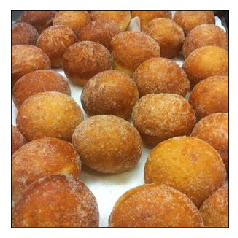

drive/My Drive/resnet-50/data/train/donuts/1503725.jpg
donuts


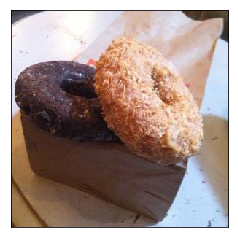

drive/My Drive/resnet-50/data/train/donuts/1359731.jpg
waffles


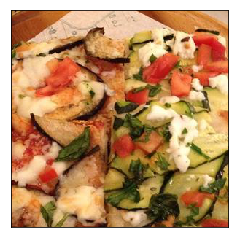

drive/My Drive/resnet-50/data/train/pizza/1209973.jpg
waffles


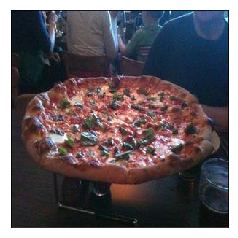

drive/My Drive/resnet-50/data/train/pizza/121960.jpg
pizza


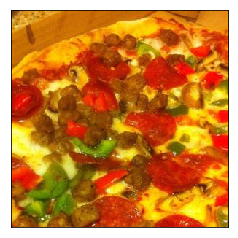

drive/My Drive/resnet-50/data/train/pizza/1207213.jpg
pizza


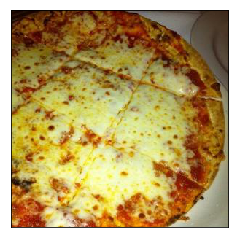

drive/My Drive/resnet-50/data/train/pizza/1351631.jpg
pizza


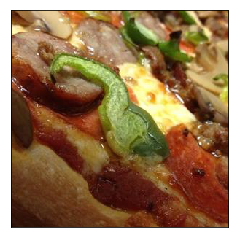

drive/My Drive/resnet-50/data/train/pizza/1425089.jpg
waffles


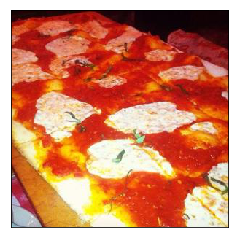

drive/My Drive/resnet-50/data/train/pizza/1179703.jpg
pizza


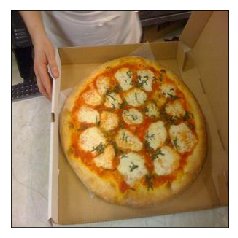

drive/My Drive/resnet-50/data/train/pizza/139952.jpg
waffles


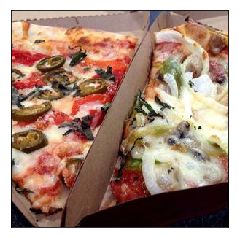

drive/My Drive/resnet-50/data/train/pizza/1245628.jpg
waffles


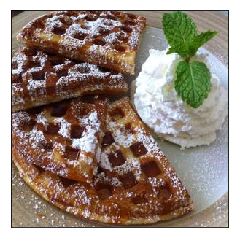

drive/My Drive/resnet-50/data/train/waffles/1522343.jpg
waffles


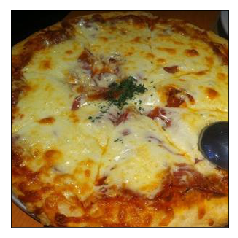

drive/My Drive/resnet-50/data/train/pizza/1445608.jpg
pizza


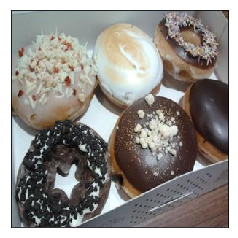

drive/My Drive/resnet-50/data/train/donuts/1391088.jpg
donuts


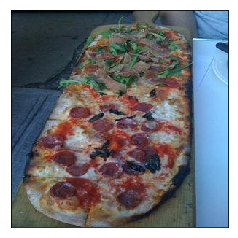

drive/My Drive/resnet-50/data/train/pizza/129536.jpg
pizza


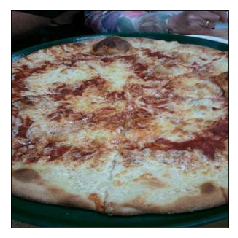

drive/My Drive/resnet-50/data/train/pizza/1226346.jpg
pizza


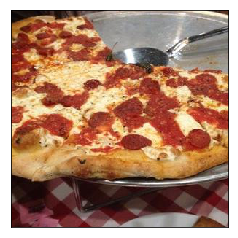

drive/My Drive/resnet-50/data/train/pizza/1183595.jpg
pizza


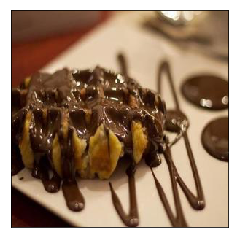

drive/My Drive/resnet-50/data/train/waffles/1215857.jpg
waffles


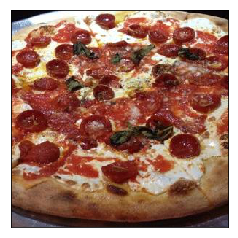

drive/My Drive/resnet-50/data/train/pizza/1326065.jpg
pizza


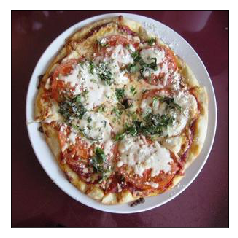

drive/My Drive/resnet-50/data/train/pizza/1459760.jpg
pizza


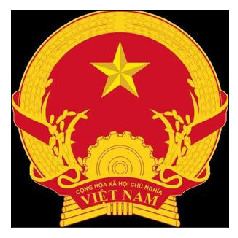

drive/My Drive/resnet-50/data/train/pizza/1454995.jpg
waffles


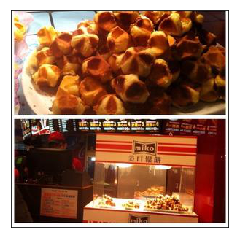

drive/My Drive/resnet-50/data/train/waffles/1343456.jpg
waffles


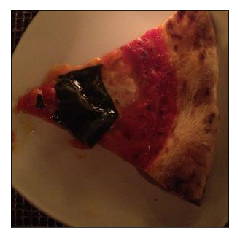

drive/My Drive/resnet-50/data/train/pizza/1275885.jpg
pizza


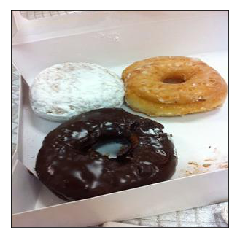

drive/My Drive/resnet-50/data/train/donuts/122399.jpg
donuts


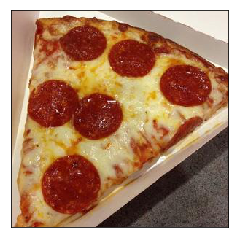

drive/My Drive/resnet-50/data/train/pizza/1512557.jpg
pizza


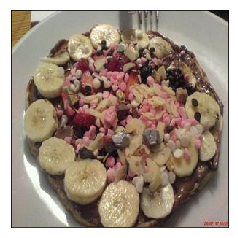

drive/My Drive/resnet-50/data/train/waffles/1386687.jpg
waffles


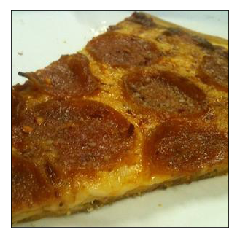

drive/My Drive/resnet-50/data/train/pizza/1287004.jpg
pizza


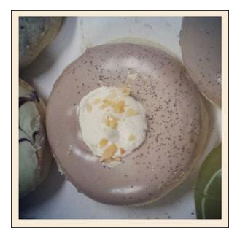

drive/My Drive/resnet-50/data/train/donuts/1536111.jpg
donuts


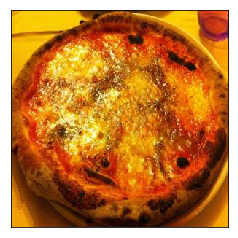

drive/My Drive/resnet-50/data/train/pizza/1202689.jpg
pizza


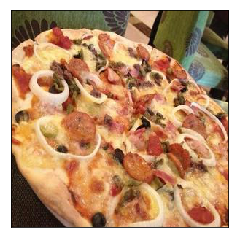

drive/My Drive/resnet-50/data/train/pizza/1503858.jpg
pizza


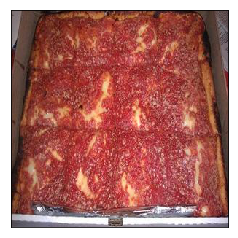

drive/My Drive/resnet-50/data/train/pizza/1248346.jpg
pizza


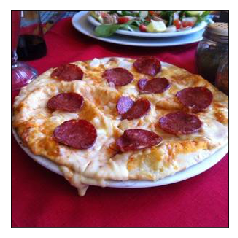

drive/My Drive/resnet-50/data/train/pizza/1202925.jpg
waffles


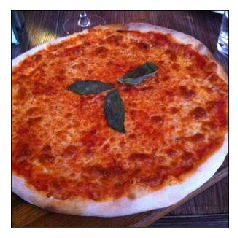

drive/My Drive/resnet-50/data/train/pizza/1524655.jpg
pizza


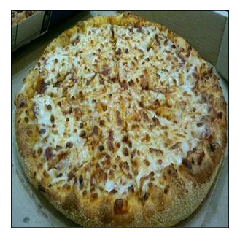

drive/My Drive/resnet-50/data/train/pizza/1504421.jpg
pizza


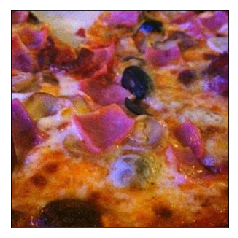

drive/My Drive/resnet-50/data/train/pizza/1312761.jpg
waffles


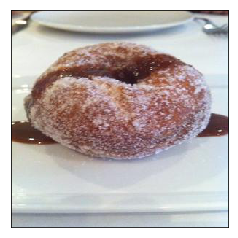

drive/My Drive/resnet-50/data/train/donuts/130235.jpg
pizza


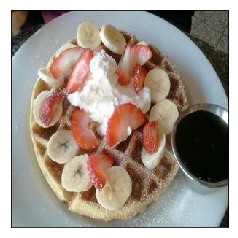

drive/My Drive/resnet-50/data/train/waffles/1395475.jpg
waffles


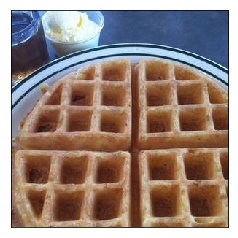

drive/My Drive/resnet-50/data/train/waffles/1313096.jpg
waffles


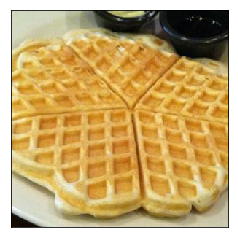

drive/My Drive/resnet-50/data/train/waffles/1376085.jpg
waffles


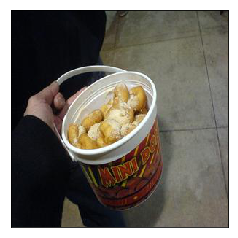

drive/My Drive/resnet-50/data/train/donuts/1446027.jpg
waffles


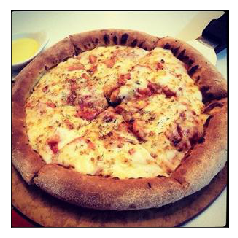

drive/My Drive/resnet-50/data/train/pizza/1535273.jpg
pizza


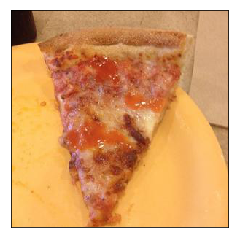

drive/My Drive/resnet-50/data/train/pizza/1205154.jpg
pizza


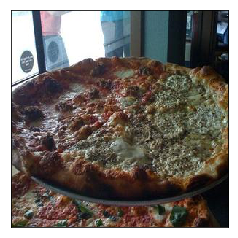

drive/My Drive/resnet-50/data/train/pizza/13983.jpg
pizza


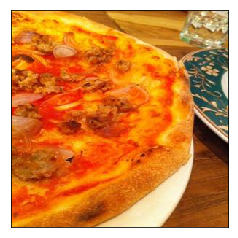

drive/My Drive/resnet-50/data/train/pizza/143453.jpg
pizza


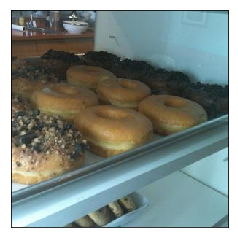

drive/My Drive/resnet-50/data/train/donuts/1394857.jpg
pizza


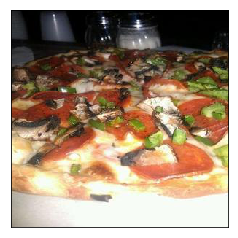

drive/My Drive/resnet-50/data/train/pizza/1180001.jpg
pizza


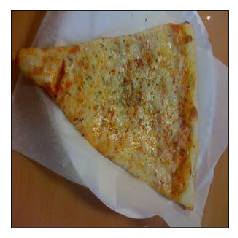

drive/My Drive/resnet-50/data/train/pizza/139987.jpg
pizza


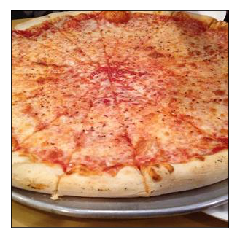

drive/My Drive/resnet-50/data/train/pizza/1403878.jpg
pizza


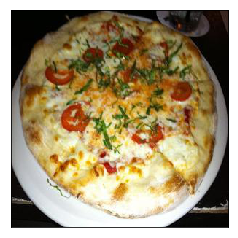

drive/My Drive/resnet-50/data/train/pizza/1413289.jpg
pizza


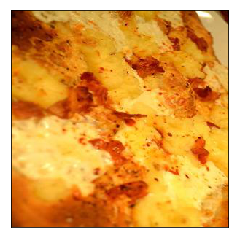

drive/My Drive/resnet-50/data/train/pizza/1220156.jpg
pizza


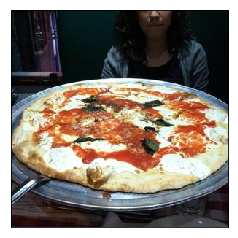

drive/My Drive/resnet-50/data/train/pizza/1325918.jpg
pizza


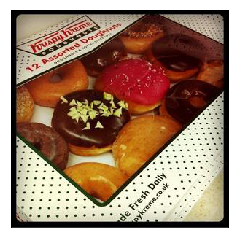

drive/My Drive/resnet-50/data/train/donuts/1502830.jpg
waffles


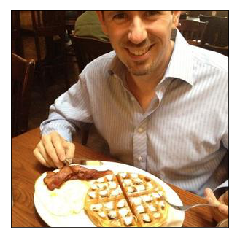

drive/My Drive/resnet-50/data/train/waffles/1318213.jpg
waffles


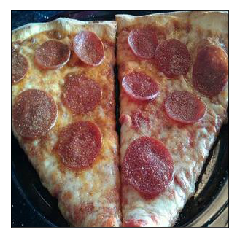

drive/My Drive/resnet-50/data/train/pizza/1248478.jpg
pizza


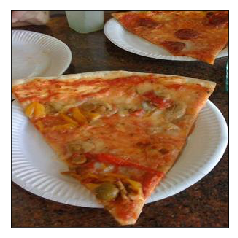

drive/My Drive/resnet-50/data/train/pizza/1267359.jpg
pizza


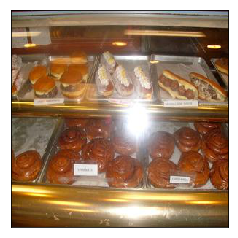

drive/My Drive/resnet-50/data/train/donuts/129078.jpg
waffles


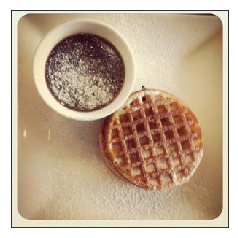

drive/My Drive/resnet-50/data/train/waffles/1377375.jpg
waffles


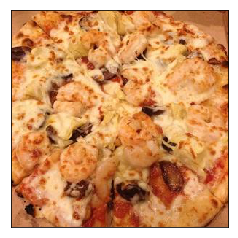

drive/My Drive/resnet-50/data/train/pizza/1506213.jpg
pizza


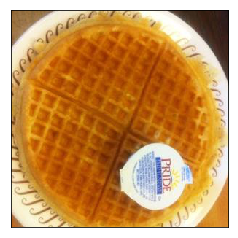

drive/My Drive/resnet-50/data/train/waffles/1514054.jpg
waffles


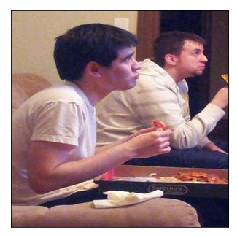

drive/My Drive/resnet-50/data/train/pizza/1407753.jpg
waffles


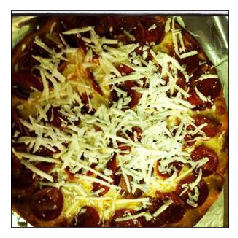

drive/My Drive/resnet-50/data/train/pizza/1260554.jpg
pizza


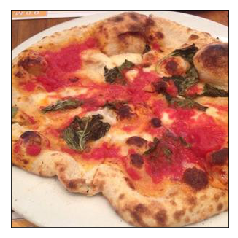

drive/My Drive/resnet-50/data/train/pizza/1412034.jpg
pizza


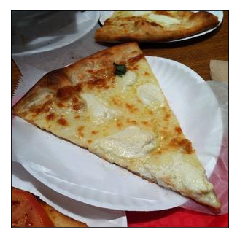

drive/My Drive/resnet-50/data/train/pizza/1468795.jpg
pizza


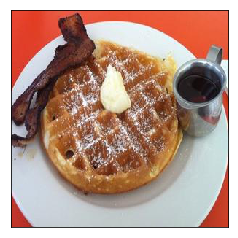

drive/My Drive/resnet-50/data/train/waffles/125490.jpg
waffles


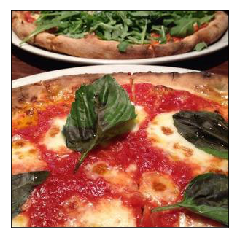

drive/My Drive/resnet-50/data/train/pizza/1423515.jpg
pizza


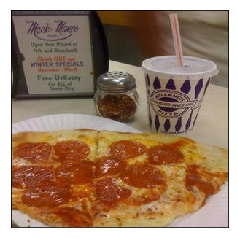

drive/My Drive/resnet-50/data/train/pizza/138961.jpg
pizza


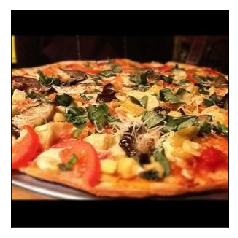

drive/My Drive/resnet-50/data/train/pizza/1380247.jpg
pizza


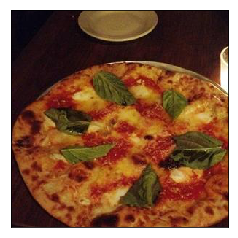

drive/My Drive/resnet-50/data/train/pizza/1398213.jpg
pizza


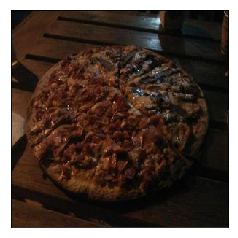

drive/My Drive/resnet-50/data/train/pizza/1544197.jpg
pizza


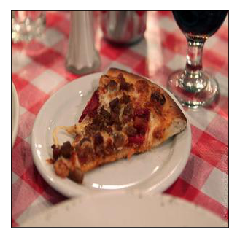

drive/My Drive/resnet-50/data/train/pizza/1265335.jpg
waffles


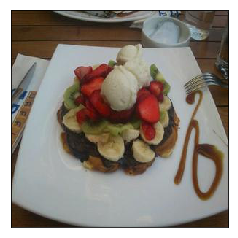

drive/My Drive/resnet-50/data/train/waffles/1484347.jpg
waffles


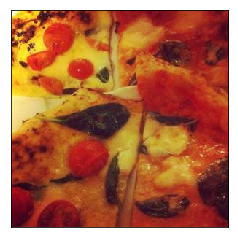

drive/My Drive/resnet-50/data/train/pizza/1412011.jpg
pizza


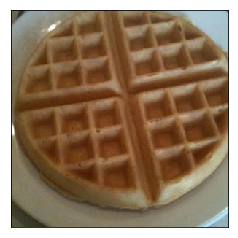

drive/My Drive/resnet-50/data/train/waffles/1462386.jpg
waffles


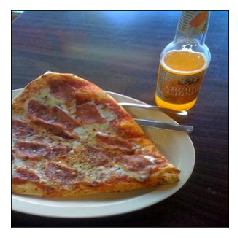

drive/My Drive/resnet-50/data/train/pizza/140016.jpg
pizza


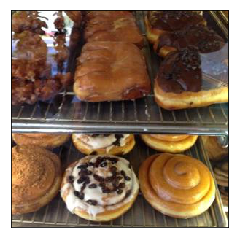

drive/My Drive/resnet-50/data/train/donuts/1282656.jpg
waffles


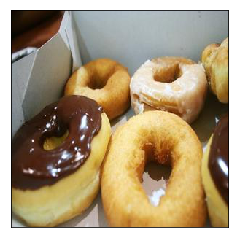

drive/My Drive/resnet-50/data/train/donuts/139130.jpg
donuts


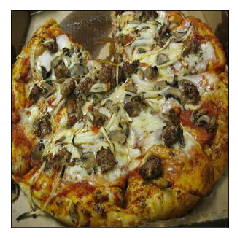

drive/My Drive/resnet-50/data/train/pizza/1180273.jpg
pizza


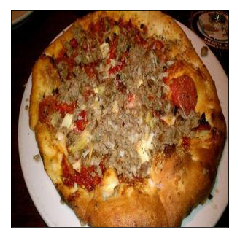

drive/My Drive/resnet-50/data/train/pizza/1384464.jpg
pizza


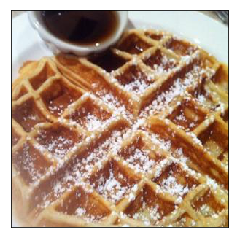

drive/My Drive/resnet-50/data/train/waffles/1286272.jpg
waffles


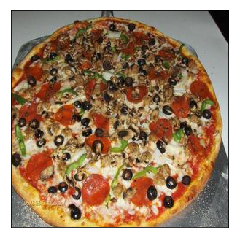

drive/My Drive/resnet-50/data/train/pizza/148765.jpg
pizza


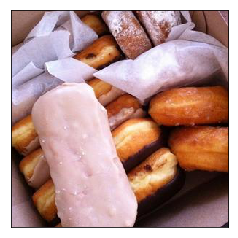

drive/My Drive/resnet-50/data/train/donuts/1381911.jpg
waffles


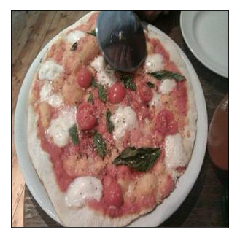

drive/My Drive/resnet-50/data/train/pizza/1285298.jpg
waffles


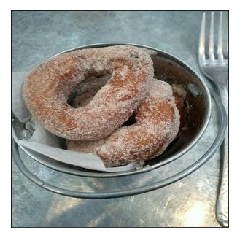

drive/My Drive/resnet-50/data/train/donuts/1387748.jpg
donuts


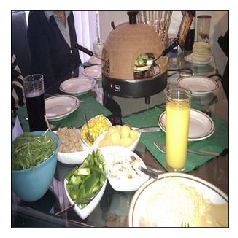

drive/My Drive/resnet-50/data/train/pizza/1234172.jpg
waffles


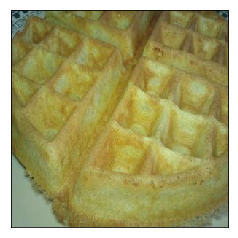

drive/My Drive/resnet-50/data/train/waffles/1231392.jpg
waffles


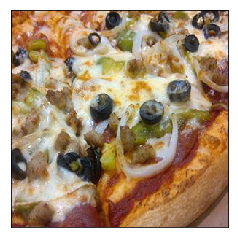

drive/My Drive/resnet-50/data/train/pizza/1426781.jpg
pizza


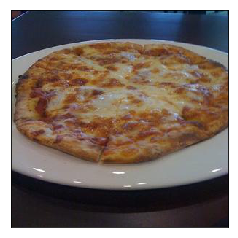

drive/My Drive/resnet-50/data/train/pizza/131561.jpg
pizza


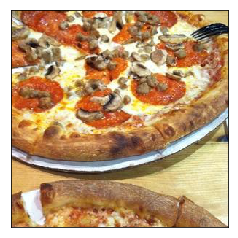

drive/My Drive/resnet-50/data/train/pizza/1289139.jpg
pizza


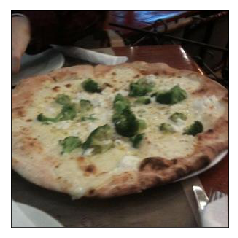

drive/My Drive/resnet-50/data/train/pizza/1223284.jpg
pizza


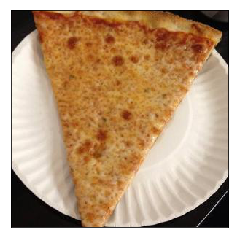

drive/My Drive/resnet-50/data/train/pizza/1315645.jpg
pizza


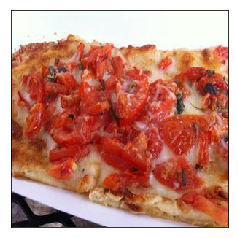

drive/My Drive/resnet-50/data/train/pizza/132484.jpg
pizza


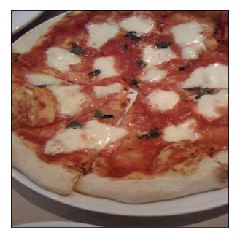

drive/My Drive/resnet-50/data/train/pizza/124815.jpg
pizza


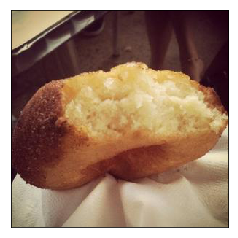

drive/My Drive/resnet-50/data/train/donuts/1264663.jpg
waffles


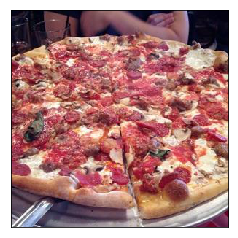

drive/My Drive/resnet-50/data/train/pizza/1183278.jpg
pizza


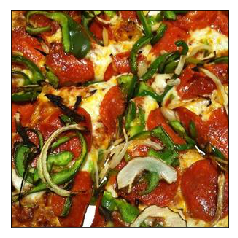

drive/My Drive/resnet-50/data/train/pizza/1370319.jpg
waffles


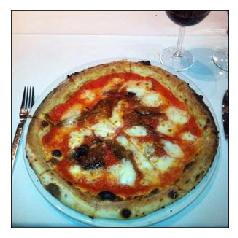

drive/My Drive/resnet-50/data/train/pizza/1504719.jpg
pizza


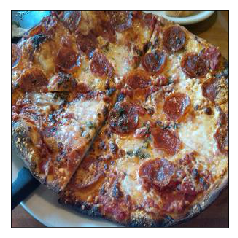

drive/My Drive/resnet-50/data/train/pizza/12718.jpg
pizza


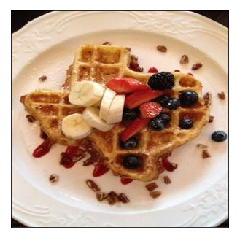

drive/My Drive/resnet-50/data/train/waffles/1414127.jpg
waffles


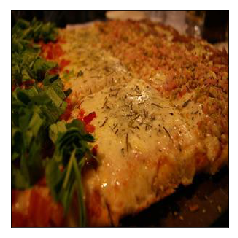

drive/My Drive/resnet-50/data/train/pizza/1243215.jpg
pizza


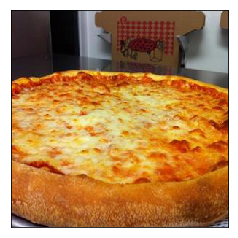

drive/My Drive/resnet-50/data/train/pizza/134462.jpg
pizza


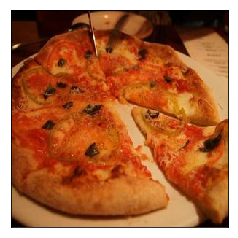

drive/My Drive/resnet-50/data/train/pizza/1390308.jpg
pizza


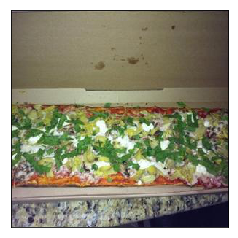

drive/My Drive/resnet-50/data/train/pizza/1351146.jpg
pizza


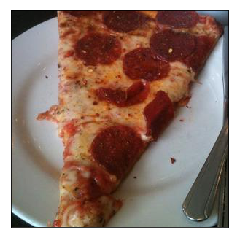

drive/My Drive/resnet-50/data/train/pizza/1524599.jpg
pizza


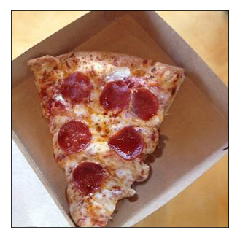

drive/My Drive/resnet-50/data/train/pizza/1344966.jpg
waffles


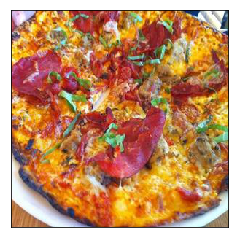

drive/My Drive/resnet-50/data/train/pizza/141507.jpg
pizza


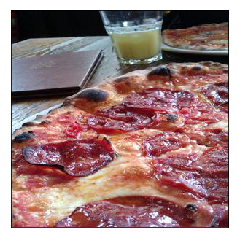

drive/My Drive/resnet-50/data/train/pizza/1247645.jpg
pizza


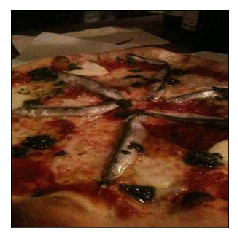

drive/My Drive/resnet-50/data/train/pizza/12301.jpg
pizza


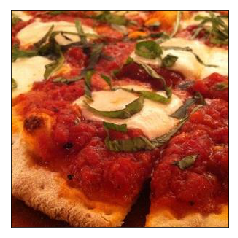

drive/My Drive/resnet-50/data/train/pizza/1269960.jpg
pizza


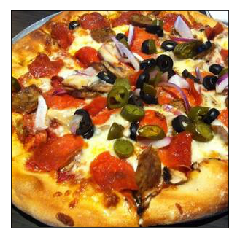

drive/My Drive/resnet-50/data/train/pizza/1499661.jpg
pizza


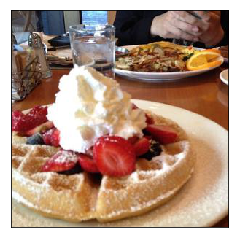

drive/My Drive/resnet-50/data/train/waffles/1406502.jpg
waffles


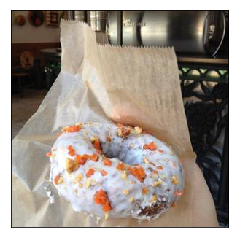

drive/My Drive/resnet-50/data/train/donuts/1478125.jpg
waffles


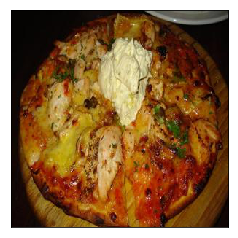

drive/My Drive/resnet-50/data/train/pizza/121834.jpg
pizza


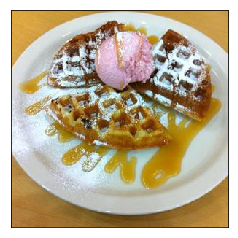

drive/My Drive/resnet-50/data/train/waffles/1336006.jpg
waffles


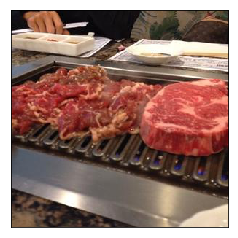

drive/My Drive/resnet-50/data/train/pizza/1512514.jpg
waffles


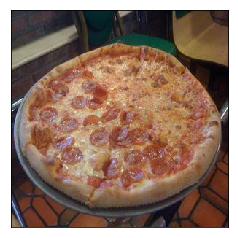

drive/My Drive/resnet-50/data/train/pizza/140031.jpg
pizza


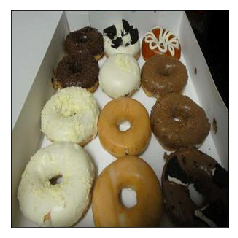

drive/My Drive/resnet-50/data/train/donuts/1244316.jpg
donuts


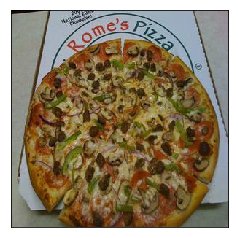

drive/My Drive/resnet-50/data/train/pizza/1399531.jpg
pizza


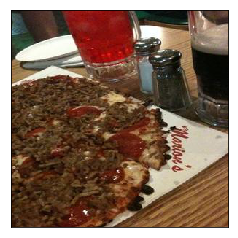

drive/My Drive/resnet-50/data/train/pizza/132554.jpg
pizza


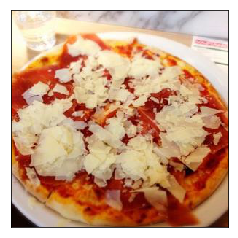

drive/My Drive/resnet-50/data/train/pizza/1228171.jpg
waffles


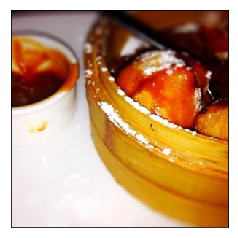

drive/My Drive/resnet-50/data/train/donuts/1290278.jpg
waffles


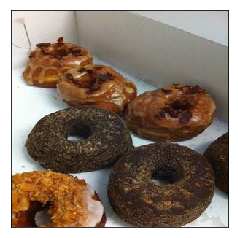

drive/My Drive/resnet-50/data/train/donuts/133819.jpg
donuts


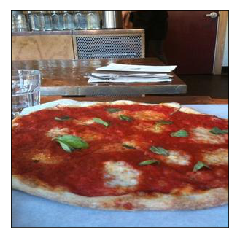

drive/My Drive/resnet-50/data/train/pizza/147785.jpg
pizza


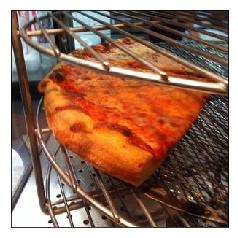

drive/My Drive/resnet-50/data/train/pizza/1284978.jpg
pizza


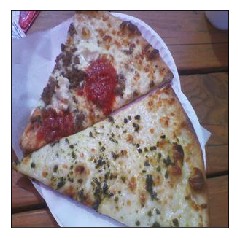

drive/My Drive/resnet-50/data/train/pizza/1507039.jpg
pizza


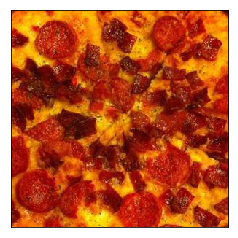

drive/My Drive/resnet-50/data/train/pizza/1173913.jpg
waffles


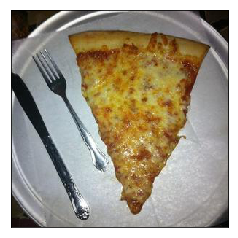

drive/My Drive/resnet-50/data/train/pizza/1342321.jpg
pizza


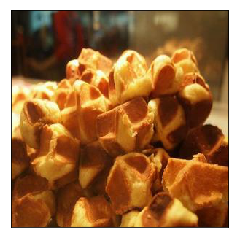

drive/My Drive/resnet-50/data/train/waffles/1343475.jpg
waffles


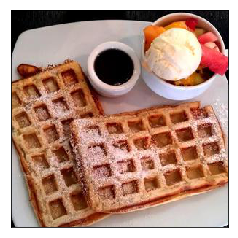

drive/My Drive/resnet-50/data/train/waffles/1185489.jpg
waffles


In [0]:


model.summary()

model.load_weights('drive/My Drive/resnet-50/output/model_weights_v2.h5')

import os, random
img_locations = []

for d in os.listdir("drive/My Drive/resnet-50/data/train/"):
    directory = "drive/My Drive/resnet-50/data/train/" + d

    sample = [directory + '/' + s for s in random.sample(
        os.listdir(directory), int(random.random()*100))]
    img_locations += sample

def read_and_prep_images(img_paths, img_height=image_size, img_width=image_size):
    imgs = [load_img(img_path, target_size=(img_height, img_width)) for img_path in img_paths]
    img_array = np.array([img_to_array(img) for img in imgs])
    return preprocess_input(img_array)

random.shuffle(img_locations)
imgs = read_and_prep_images(img_locations)
predictions = model.predict_classes(imgs)

classes = dict((v,k) for k,v in train_generator.class_indices.items())
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as pp

for img, prediction in zip(img_locations, predictions):
    image = pp.imread(img)    
    #cv2.imshow('r',image)
    #cv2.waitKey(0)
    img_plot = plt.imshow(image)
    #Set up the plot and hide axes
    #plt.title(text)
    img_plot.axes.get_yaxis().set_ticks([])
    img_plot.axes.get_xaxis().set_ticks([])
    plt.show()
    print(img)
    print(classes[prediction])
    
score, acc = model.evaluate(x_test, y_test,
                            batch_size=batch_size)
print('Test score:', score)
print('Test accuracy:', acc)

In [0]:

score, acc = model.evaluate(x_test, y_test,
                            batch_size=batch_size)
print('Test score:', score)
print('Test accuracy:', acc)

In [0]:

model.evaluate_generator(generator=valid_generator)
# test_generator.reset()
print('model evaluated!')
print("****")

pred=model.predict_generator(test_generator,verbose=1)
predicted_class_indices=np.argmax(pred)
print('predicting class')
print(predicted_class_indices)
print("****")

labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
print('Labels')
print(labels)
print("****")


model evaluated!
****
150/150 [==============================] - 43s 288ms/step
predicting class
2
****
Labels
{0: 'donuts', 1: 'pizza', 2: 'waffles'}
****


In [0]:


ff = []
# predictions = [labels[k] for k in predicted_class_indices]

for i in range(predicted_class_indices):
  ff.append(labels[i])
  
print('predictions')
print(predictions)
print("****")

filenames=test_generator.filenames
print('filenames')
print(filenames)
print("****")

# results=pd.DataFrame({"Filename":filenames,
#                       "Predictions":predictions})
# results.to_csv("results.csv",index=False)
# print("****")

predictions
[0 2 2 2 2 1 2 1 2 2 1 2 0 1 1 1 0 1 2 2 1 2 0 1 2 1 2 2 2 2 2 2 2 1 2 1 0
 1 2 1 1 2 2 2 0 1 1 1 2 0 2 2 2 2 2 2 2 2 1 2 2 2 2 1 0 0 2 0 2 1 2 2 1 2
 2 1 1 1 1 1 2 2 2 2 1 0 0 1 0 2 0 0 2 0 2 1 0 2 0 2 1 2 2 0 2 2 1 2 1 0 2
 2 2 2 0 1 2 1 2 2 0 0 0 1 0 2 1 2 2 1 0 2 1 2 1]
****
filenames
['donuts/100076.jpg', 'donuts/100576.jpg', 'donuts/1006079.jpg', 'donuts/1007399.jpg', 'donuts/100786.jpg', 'donuts/1008454.jpg', 'donuts/1008483.jpg', 'donuts/1013269.jpg', 'donuts/101905.jpg', 'donuts/1021740.jpg', 'donuts/1023706.jpg', 'donuts/1030973.jpg', 'donuts/1031654.jpg', 'donuts/1035519.jpg', 'donuts/1035608.jpg', 'donuts/1035974.jpg', 'donuts/1037309.jpg', 'donuts/1038717.jpg', 'donuts/1040071.jpg', 'donuts/1040226.jpg', 'donuts/1044089.jpg', 'donuts/104498.jpg', 'donuts/105814.jpg', 'donuts/1065812.jpg', 'donuts/1073755.jpg', 'donuts/1078111.jpg', 'donuts/1083749.jpg', 'donuts/1085096.jpg', 'donuts/108879.jpg', 'donuts/1090548.jpg', 'donuts/1102701.jpg', 'donuts/1103380.jpg', 

In [0]:
import random
import cv2
import glob
import os
from keras.models import load_model
from keras.preprocessing import image
from sklearn.model_selection import train_test_split
from keras.datasets import cifar10
from keras.utils import to_categorical
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D
from keras.optimizers import SGD
from keras.applications.inception_v3 import InceptionV3
from keras.applications.resnet50 import ResNet50
from keras.applications.vgg19 import VGG19
from keras.applications.vgg16 import VGG16
from keras.applications.xception import Xception
import numpy as np
from keras.applications.resnet50 import preprocess_input, decode_predictions

def create_data(file_path,type):
    image_file = glob.glob(os.path.join(file_path,'*.jpg'))
    img_list = []
    for img in image_file:
        image =cv2.imread(img)
        image = cv2.resize(image,(224,224),interpolation=cv2.INTER_CUBIC)
        img_list.append(image)
    images = np.stack(img_list,axis=0)
    label = np.full((len(images),1),type,dtype=int)
    return images,label

file_path = 'drive/My Drive/resnet-50/data/valid/donuts/'
image_1,label_1 = create_data(file_path,0)
file_path = 'drive/My Drive/resnet-50/data/valid/pizza/'
image_2,label_2 = create_data(file_path,1)
file_path = 'drive/My Drive/resnet-50/data/valid/waffles/'
image_3,label_3 = create_data(file_path,2)

data = np.concatenate((image_1,image_2,image_3),axis=0)
print("Final data shape",np.shape(data))
label = np.concatenate((label_1,label_2,label_3),axis=0)
print("label:{}".format(np.shape(label)))

np.save('data.npy',data)
np.save('label.npy',label)

#load data:
data = np.load('data.npy')
label = np.load('label.npy')

x_train, x_test, y_train, y_test = train_test_split(data,label,test_size=0.2)
print("training data shape:{},{}".format(np.shape(x_train),np.shape(y_train)))
print("testing data shape:{},{}".format(np.shape(x_test),np.shape(y_test)))
# limit the amount of the data
# print("labels:{}".format(y_train))

# make explained variable hot-encoded
y_train_hot_encoded = to_categorical(y_train)
y_test_hot_encoded = to_categorical(y_test)




#load model
model.load_weights('drive/My Drive/resnet-50/output/model_weights_v2.h5')
img_path = 'drive/My Drive/resnet-50/data/valid/donuts/100076.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = model.predict(x)
print("predictions:{}".format(preds))
#preds_class = history_res_50.model.predict_classes(x)
#print("Predicted class:{}".format(preds_class))
classes = np.argmax(preds, axis=1)
print("Class:{}".format(classes))
if classes ==0:
	print("Zeros class:{}")
elif classes ==1:
	print("One class:{}")
elif classes ==2:
	print("two class:{}")
#check accuracy
print("Checking accuracy")
print("metric:{}".format(model.metrics_names))
score = model.evaluate(x_test,y_test_hot_encoded)
print("res_50:{}".format(score))
print("Testing loss:{},Test accuracy:{}".format(score[0],score[1]*100))
print("%%%% checking prediction")


Final data shape (450, 224, 224, 3)
label:(450, 1)
training data shape:(360, 224, 224, 3),(360, 1)
testing data shape:(90, 224, 224, 3),(90, 1)


NameError: ignored